# Overview
This notebook tests the constrained MetaDoE PSO implementation against four standard optimization objectives in three dimensions and ten thousand dimensions.

# Optimization

In [ ]:
include("../../../src/MetaDoE.jl")
using .MetaDoE: Experiments, ConstraintEnforcement, Constraints, PSO, Objectives, Designs, Models, OptimizationRunner, HitAndRun

In [ ]:
num_particles = 200
max_iters = 200
max_stag = 100
tolerance = 1e-6

runner_params = PSO.runner_params(max_iters, max_stag, tolerance)
pso_params = PSO.create_hyperparams(num_particles)

Main.MetaDoE.PSO.HyperParams(200, 0.7213475204444817, 1.1931471805599454, 1.1931471805599454, 3)

## 3D

In [ ]:
N = 1
K = 3
bound = 100

objectives = [Objectives.ackley, Objectives.rastrigin, Objectives.rosenbrock, Objectives.griewank]
enforcers = [ConstraintEnforcement.Resample, ConstraintEnforcement.Parametric, ConstraintEnforcement.Penalty]
A, b = Constraints.hypercube(K, bound)
experiment = Experiments.create(N, K, Models.identity)
experiment = Experiments.with_linear_constraints(experiment, A, b)
for i in 1:(K-1)
    experiment = Experiments.with_factor_ratio(experiment, i, K, 2.0)
end

In [ ]:
OptimizationRunner.run_pso_experiments(
    experiment,
    objectives, 
    enforcers, 
    runner_params,
    OptimizationRunner.save_3d_results(prefix="data/3d_constrained");
    log_iterations = false
)

PSO Context created for (ackley, Resample). Starting optimization...
PSO Context created for (rosenbrock, Penalty). Starting optimization...
PSO Context created for (ackley, Penalty). Starting optimization...
PSO Context created for (rastrigin, Penalty). Starting optimization...
PSO Context created for (griewank, Penalty). Starting optimization...
PSO Context created for (ackley, Parametric). Starting optimization...
PSO Context created for (rosenbrock, Resample). Starting optimization...
PSO Context created for (rosenbrock, Parametric). Starting optimization...
Optimization complete for (rastrigin, Penalty). Saving results...
Optimization complete for (ackley, Penalty). Saving results...
Optimization complete for (rosenbrock, Penalty). Saving results...
Optimization complete for (griewank, Penalty). Saving results...
Optimization complete for (ackley, Parametric). Saving results...
Optimization complete for (rosenbrock, Parametric). Saving results...
Optimization complete for (ackley,

## 10kD

# Visualization

In [1]:
from metadoe.visualization.convergence import plot_scores
import numpy as np
import itertools
from metadoe.visualization.phate import apply_phate, plot_phate

## Convergence Plots

### 3D

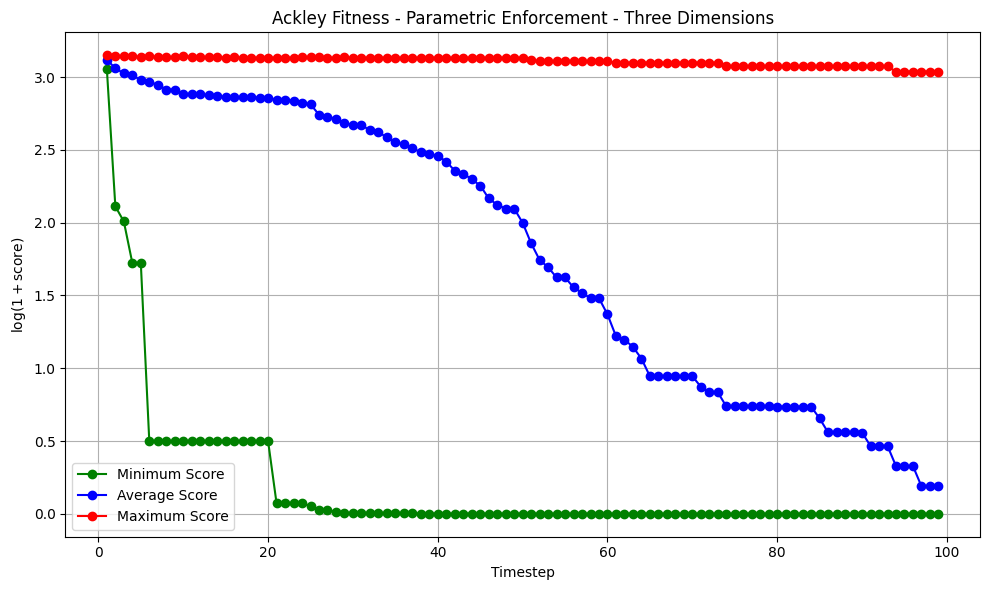

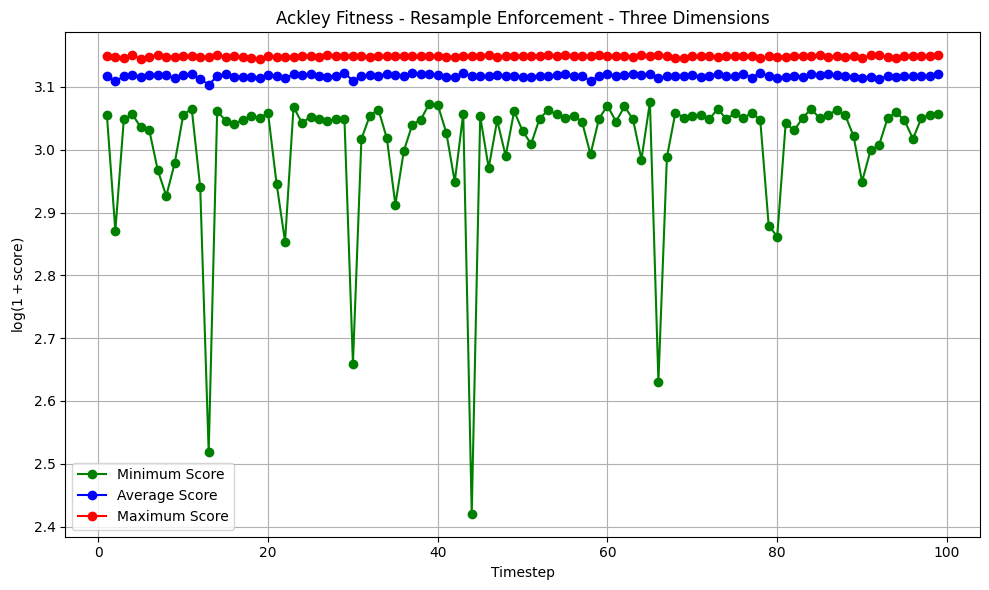

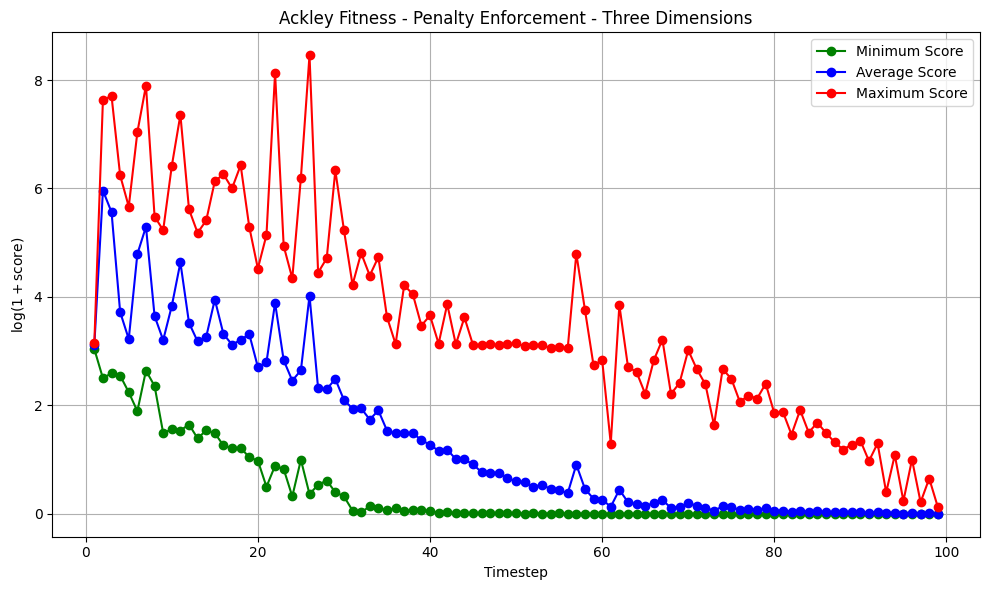

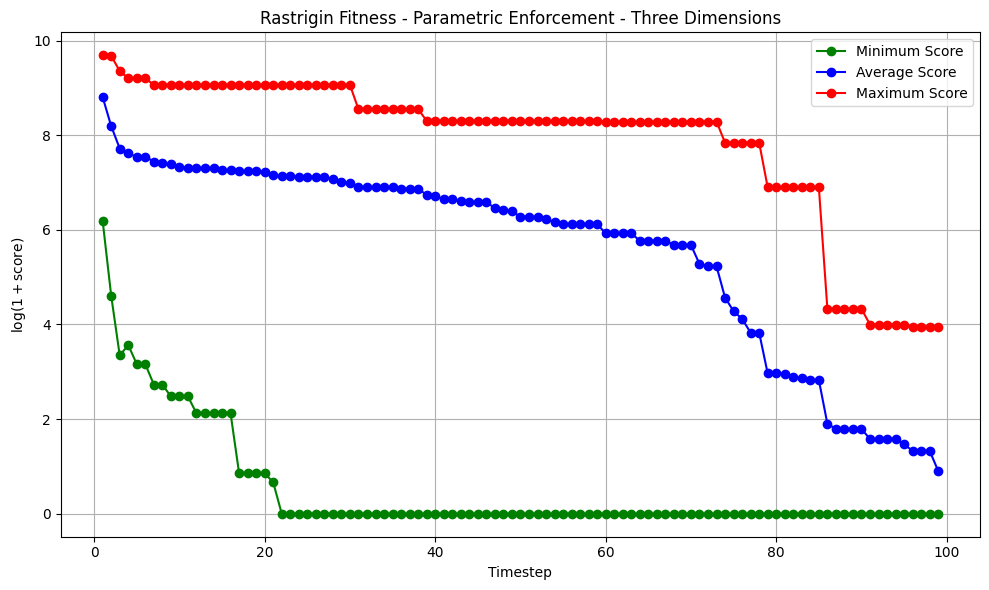

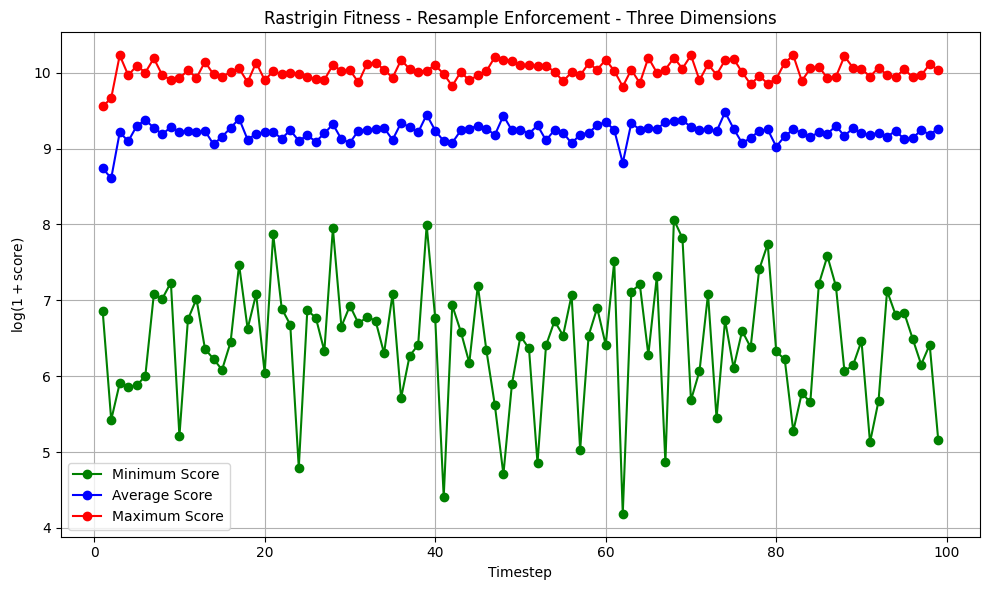

...

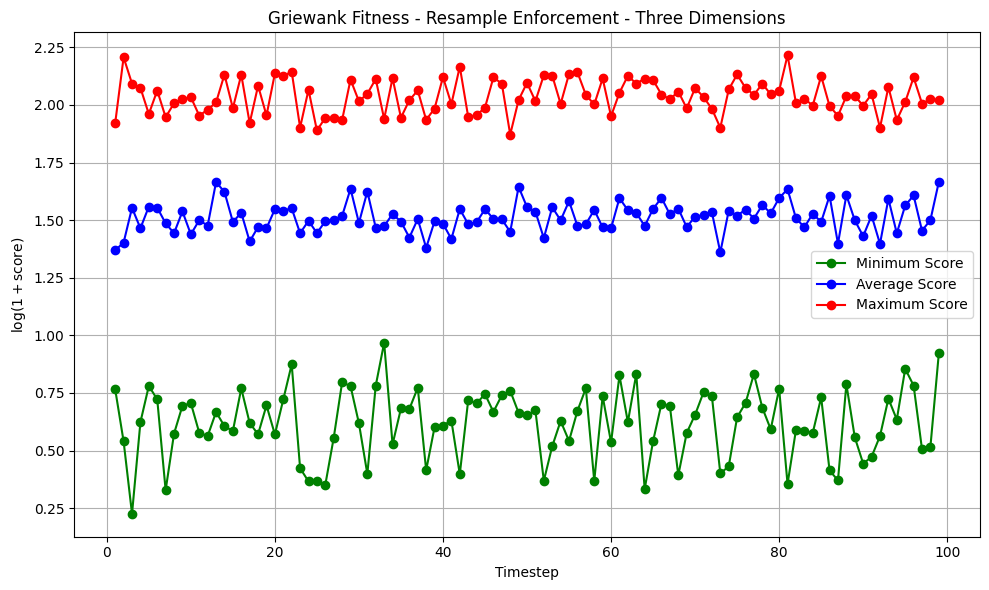

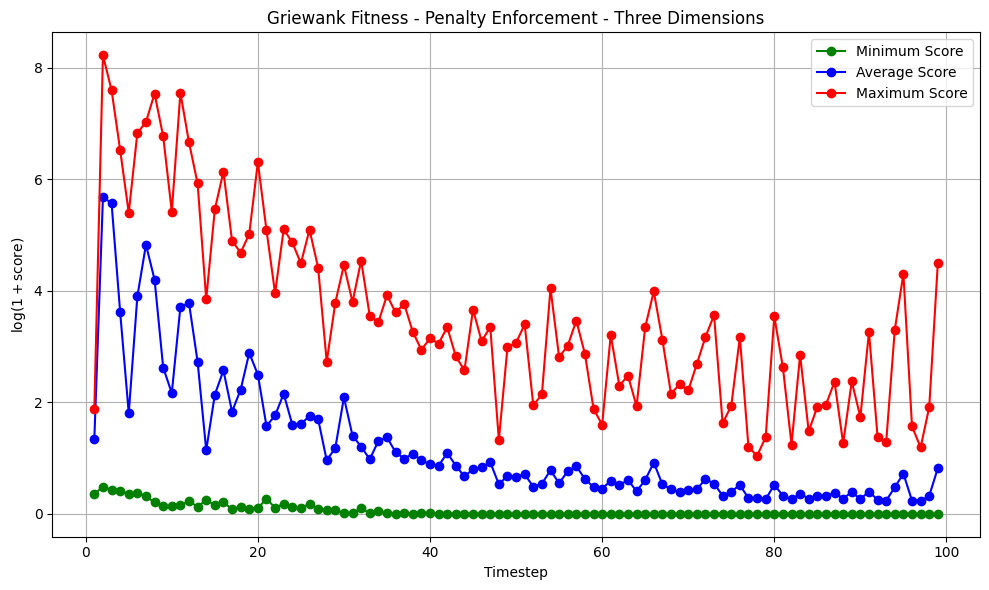

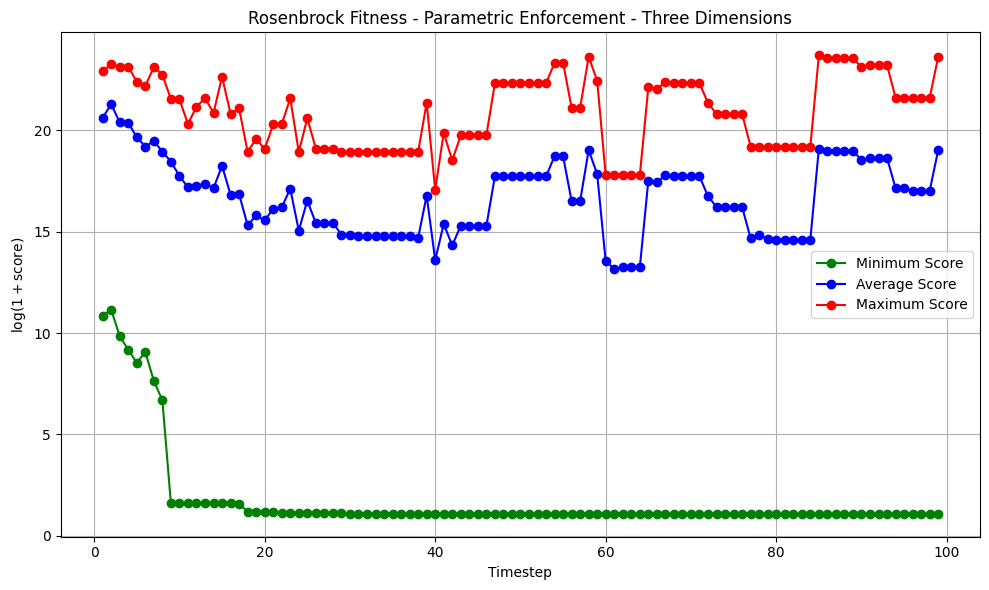

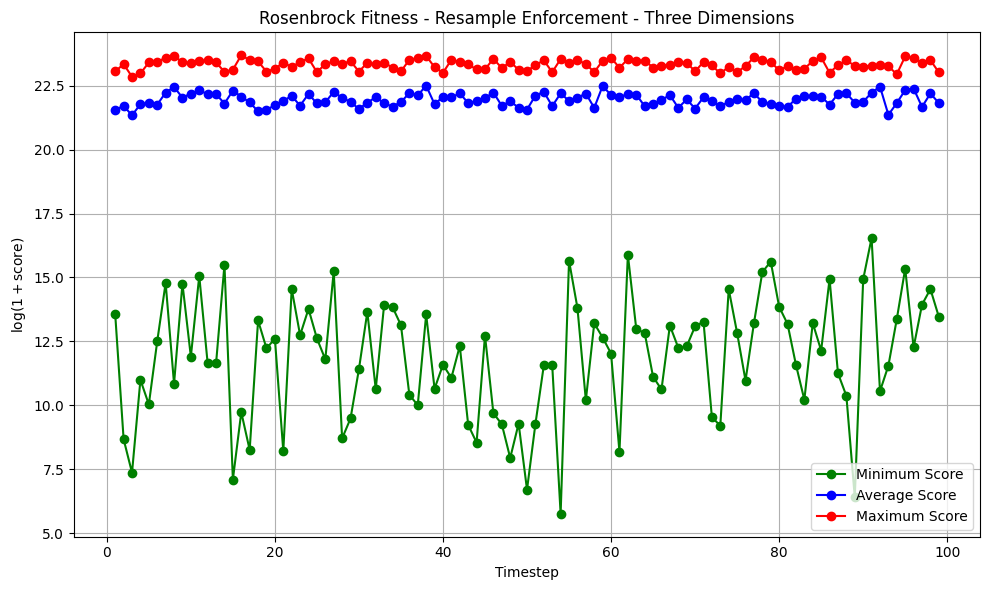

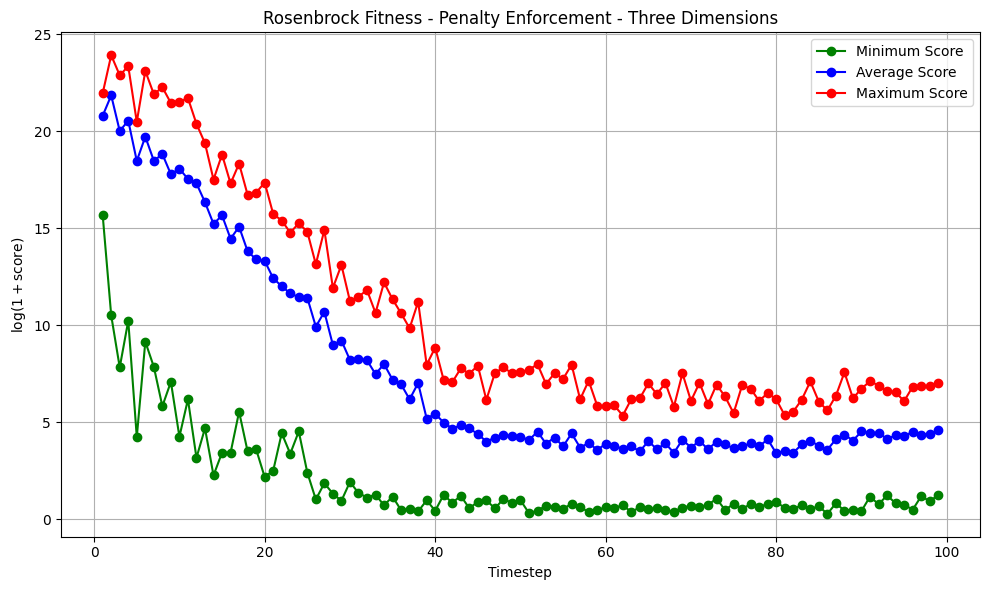

In [3]:
objectives = ['ackley', 'rastrigin', 'griewank', 'rosenbrock']
enforcers = ['Parametric', 'Resample', 'Penalty']
combos = list(itertools.product(objectives, enforcers))

for (objective, enforcer) in combos:
    data = np.load(f'data/3d_constrained_{objective}_{enforcer}.npy')
    scores = data['scores']
    plot_scores(scores, 1, 100, f"{objective.capitalize()} Fitness - {enforcer} Enforcement - Three Dimensions", f"plots/3d_constrained_{objective}_{enforcer}")

### 10kD

## PHATE Plots

### 3D

Calculating PHATE...
  Running PHATE on 16600 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 271174 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:506: RuntimeWarning: overflow encountered in power
  weights = np.exp(-np.power(scaled, decay))


    Calculated affinities in 0.29 seconds.
  Calculated graph and diffusion operator in 0.35 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/phate/phate.py:919: RuntimeWarning: Graph is disconnected with 161 connected components. This may indicate that your knn parameter (currently 5) is too small, or that your data contains distinct clusters. PHATE may not accurately represent relationships between disconnected components.
  warnings.warn(


    Calculated SVD in 0.56 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.34 seconds.
  Calculated landmark operator in 1.90 seconds.
  Calculating optimal t...
    Automatically selected t = 34
  Calculated optimal t in 0.03 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.03 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.75 seconds.
Calculated PHATE in 3.15 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 14500 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.11 seconds.
  Calculated graph and diffusion operator in 0.17 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.25 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.13 seconds.
  Calculated landmark operator in 2.38 seconds.
  Calculating optimal t...
    Automatically selected t = 50
  Calculated optimal t in 0.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.55 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.06 seconds.
Calculated PHATE in 4.91 seconds.
Calculating PHATE...
  Running PHATE on 19700 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


    Calculated KNN search in 0.13 seconds.
    Calculating affinities...
    Calculated affinities in 0.14 seconds.
  Calculated graph and diffusion operator in 0.27 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.34 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.76 seconds.
  Calculated landmark operator in 2.10 seconds.
  Calculating optimal t...
    Automatically selected t = 27
  Calculated optimal t in 0.47 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.54 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.07 seconds.
Calculated PHATE in 4.77 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 14800 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 241858 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:506: RuntimeWarning: overflow encountered in power
  weights = np.exp(-np.power(scaled, decay))


    Calculated affinities in 0.25 seconds.
  Calculated graph and diffusion operator in 0.29 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/phate/phate.py:919: RuntimeWarning: Graph is disconnected with 219 connected components. This may indicate that your knn parameter (currently 5) is too small, or that your data contains distinct clusters. PHATE may not accurately represent relationships between disconnected components.
  warnings.warn(


    Calculated SVD in 0.51 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.81 seconds.
  Calculated landmark operator in 2.32 seconds.
  Calculating optimal t...
    Automatically selected t = 26
  Calculated optimal t in 0.02 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 0.68 seconds.
Calculated PHATE in 3.46 seconds.
Calculating PHATE...
  Running PHATE on 16300 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 0.19 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.29 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.81 seconds.
  Calculated landmark operator in 2.10 seconds.
  Calculating optimal t...
    Automatically selected t = 46
  Calculated optimal t in 0.51 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.61 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by 1.6% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.12 seconds.
Calculated PHATE in 4.84 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 17000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.12 seconds.
    Calculating affinities...
    Calculated affinities in 0.13 seconds.
  Calculated graph and diffusion operator in 0.25 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.76 seconds.
  Calculated landmark operator in 2.06 seconds.
  Calculating optimal t...
    Automatically selected t = 28
  Calculated optimal t in 0.48 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.47 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.12 seconds.
Calculated PHATE in 4.67 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 14000 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 198325 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:506: RuntimeWarning: overflow encountered in power
  weights = np.exp(-np.power(scaled, decay))


    Calculated affinities in 0.23 seconds.
  Calculated graph and diffusion operator in 0.27 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/phate/phate.py:919: RuntimeWarning: Graph is disconnected with 137 connected components. This may indicate that your knn parameter (currently 5) is too small, or that your data contains distinct clusters. PHATE may not accurately represent relationships between disconnected components.
  warnings.warn(


    Calculated SVD in 0.42 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.66 seconds.
  Calculated landmark operator in 2.08 seconds.
  Calculating optimal t...
    Automatically selected t = 26
  Calculated optimal t in 0.06 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.07 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.1% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.71 seconds.
Calculated PHATE in 4.31 seconds.
Calculating PHATE...
  Running PHATE on 10400 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.09 seconds.
  Calculated graph and diffusion operator in 0.13 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 99 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.18 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.52 seconds.
  Calculated landmark operator in 1.71 seconds.
  Calculating optimal t...
    Automatically selected t = 52
  Calculated optimal t in 0.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.57 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.1% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.12 seconds.
Calculated PHATE in 4.27 seconds.
Calculating PHATE...
  Running PHATE on 15600 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


    Calculated KNN search in 0.09 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 0.22 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.28 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.94 seconds.
  Calculated landmark operator in 2.22 seconds.
  Calculating optimal t...
    Automatically selected t = 61
  Calculated optimal t in 0.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.75 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 1.10 seconds.
Calculated PHATE in 5.05 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 16200 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.04 seconds.
    Calculating affinities...
    Calculated affinities in 0.18 seconds.
  Calculated graph and diffusion operator in 0.23 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 82316 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:506: RuntimeWarning: overflow encountered in power
  weights = np.exp(-np.power(scaled, decay))
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/phate/phate.py:919: RuntimeWarning: Graph is disconnected with 286 connected components. This may indicate that your knn parameter (currently 5) is too small, or that your data contains distinct clusters. PHATE may not accurately represent relationships between disconnected components.
  warnings.warn(


    Calculated SVD in 0.33 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.71 seconds.
  Calculated landmark operator in 2.05 seconds.
  Calculating optimal t...
    Automatically selected t = 33
  Calculated optimal t in 0.45 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.42 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.5% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.08 seconds.
Calculated PHATE in 4.55 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 15500 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.06 seconds.
    Calculating affinities...
    Calculated affinities in 0.12 seconds.
  Calculated graph and diffusion operator in 0.19 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.28 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.00 seconds.
  Calculated landmark operator in 2.28 seconds.
  Calculating optimal t...
    Automatically selected t = 48
  Calculated optimal t in 0.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.47 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.3% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.10 seconds.
Calculated PHATE in 4.80 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize, subplot_kw=subplot_kw)
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Calculating PHATE...
  Running PHATE on 20100 observations and 3 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.11 seconds.
    Calculating affinities...
    Calculated affinities in 0.15 seconds.
  Calculated graph and diffusion operator in 0.27 seconds.
  Calculating landmark operator...
    Calculating SVD...


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/graphtools/graphs.py:810: RuntimeWarning: Detected zero distance between 100 pairs of samples. Consider removing duplicates to avoid errors in downstream processing.
  warnings.warn(


    Calculated SVD in 0.39 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.50 seconds.
  Calculated landmark operator in 2.89 seconds.
  Calculating optimal t...
    Automatically selected t = 38
  Calculated optimal t in 0.49 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.55 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -2.8% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 1.20 seconds.
Calculated PHATE in 5.71 seconds.


/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()
/Users/ben/Code/MetaDoE/.venv/lib/python3.11/site-packages/scprep/plot/utils.py:104: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


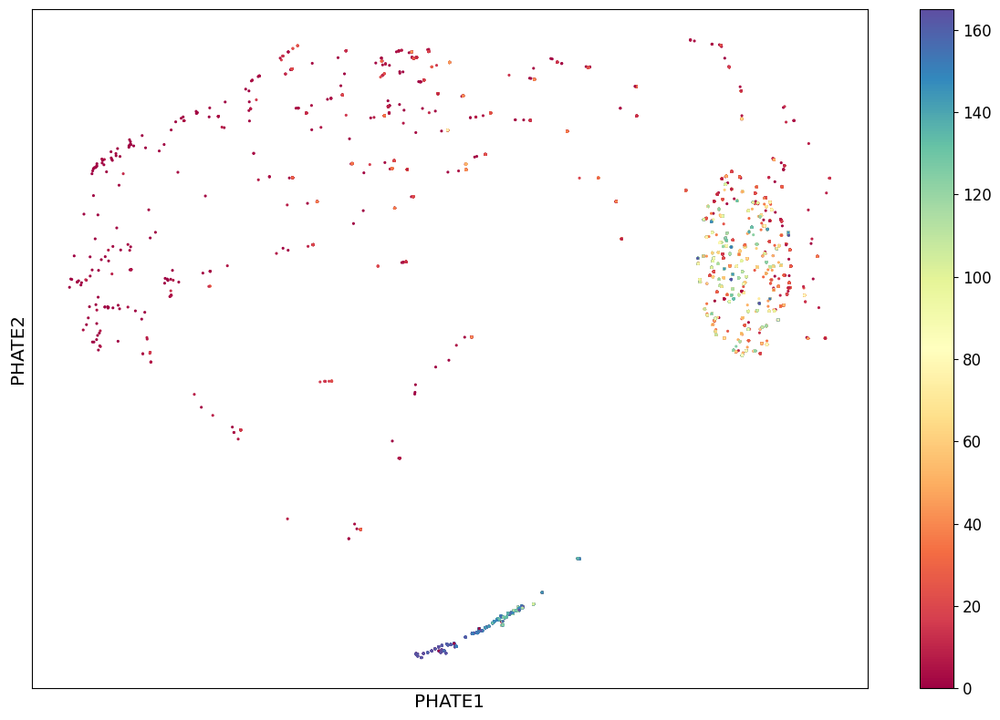

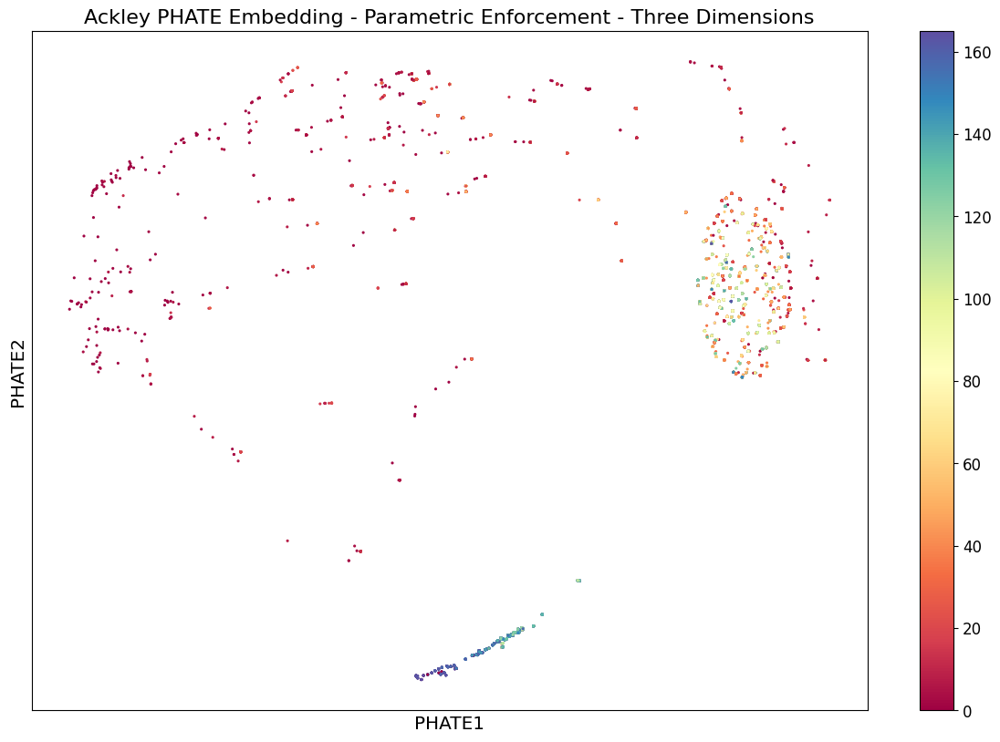

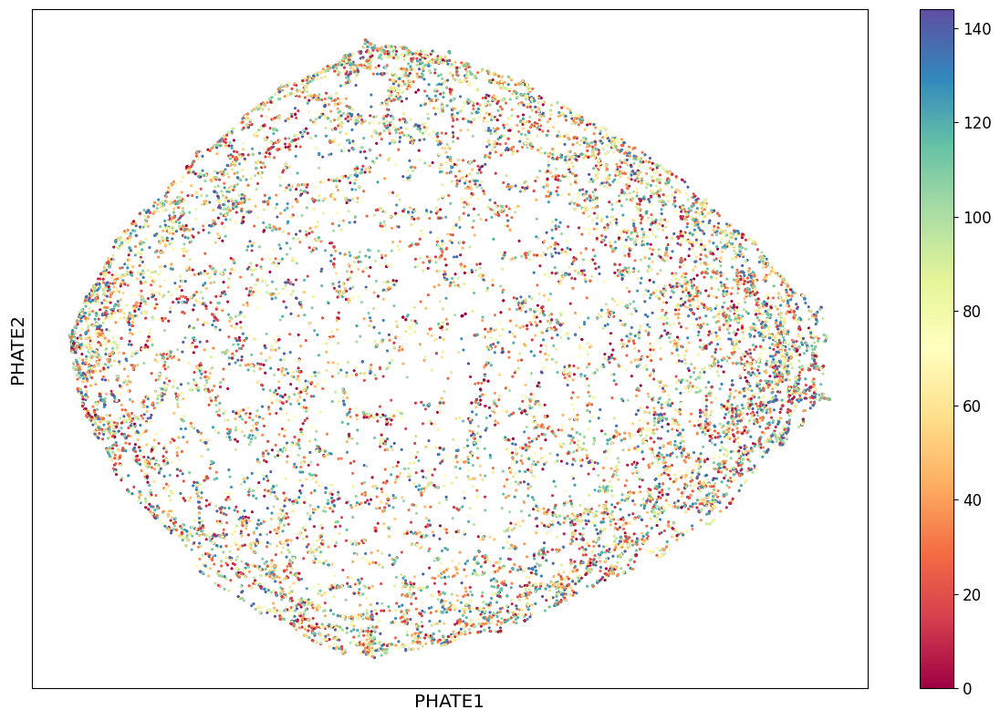

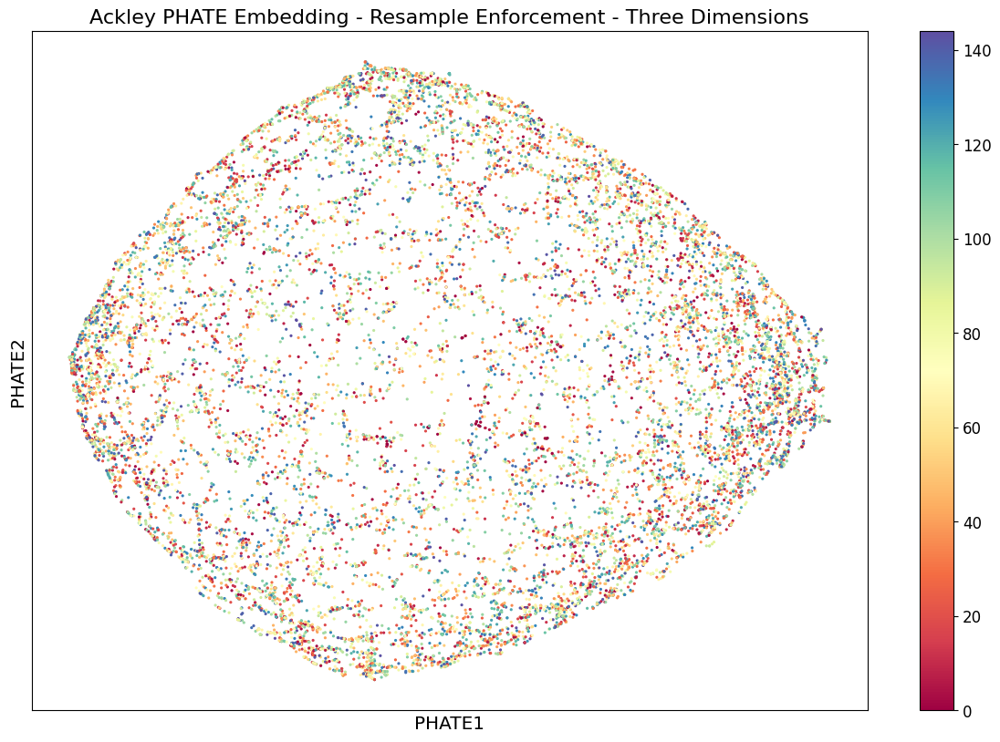

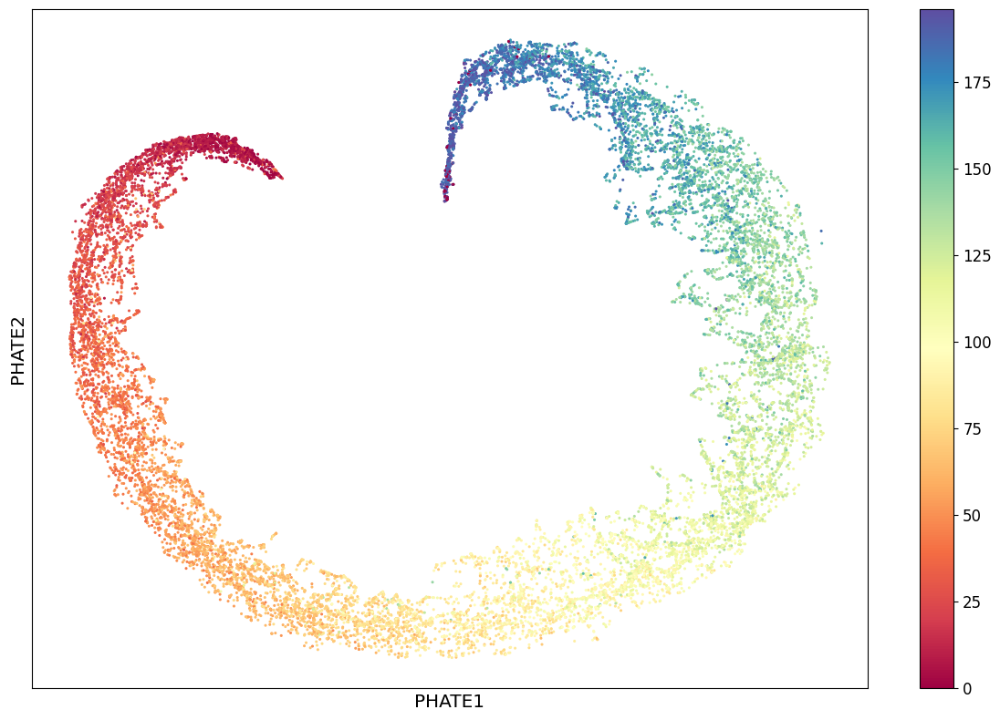

...

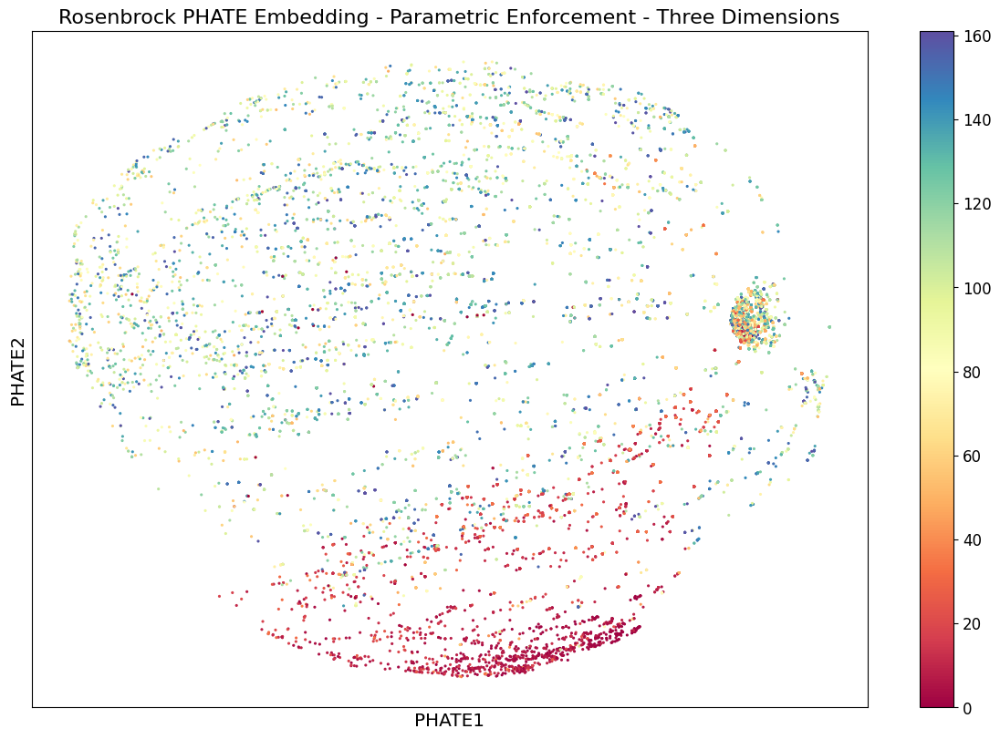

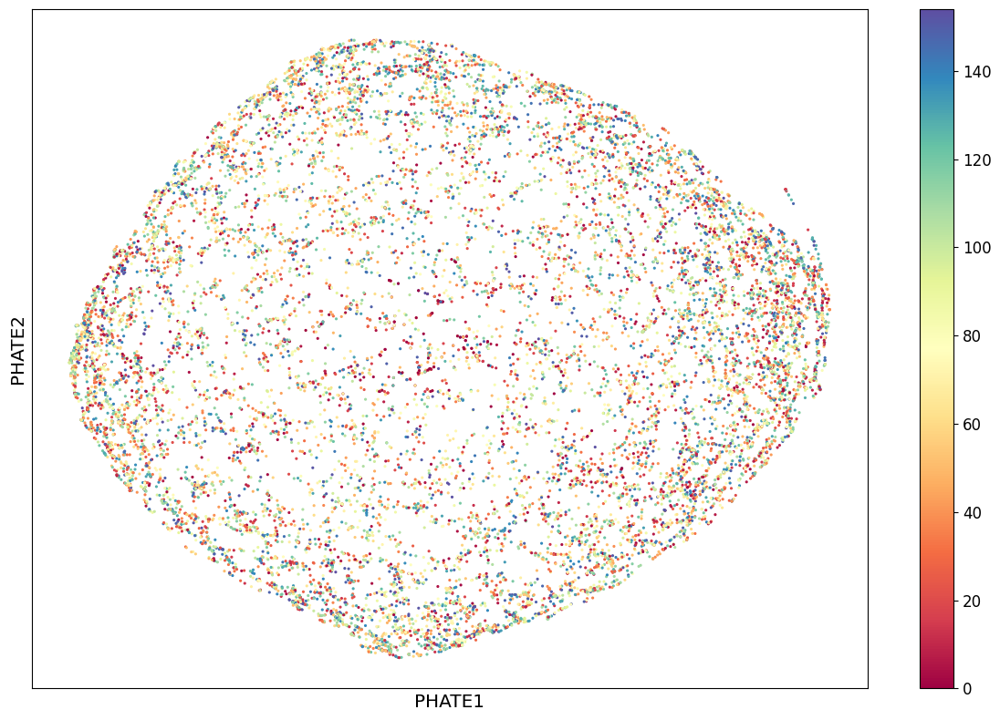

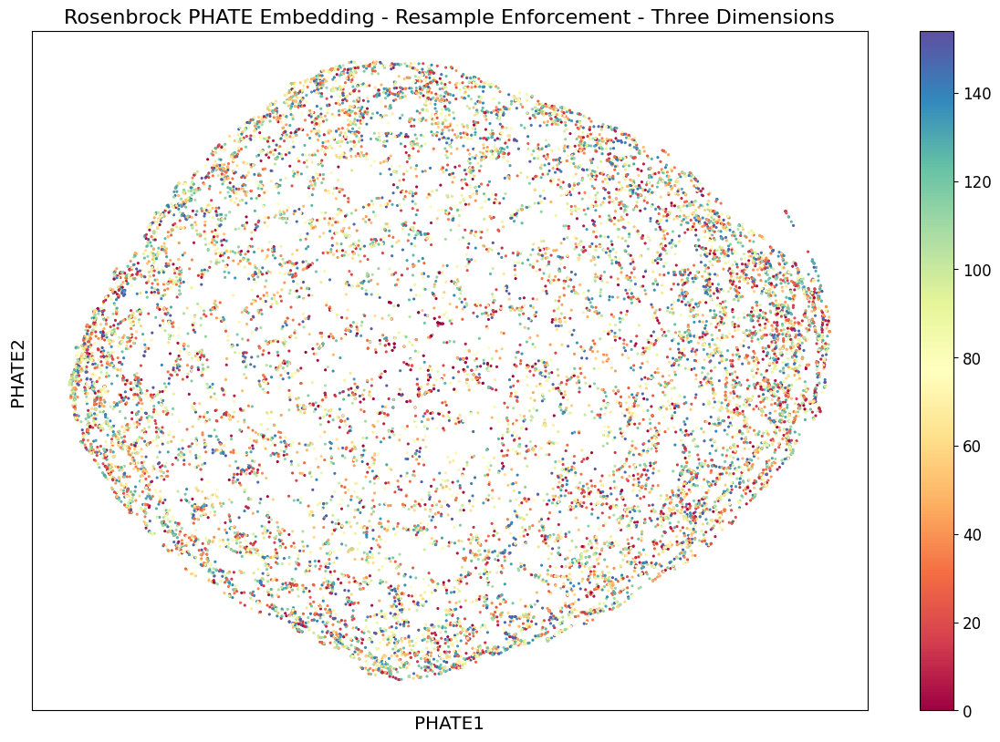

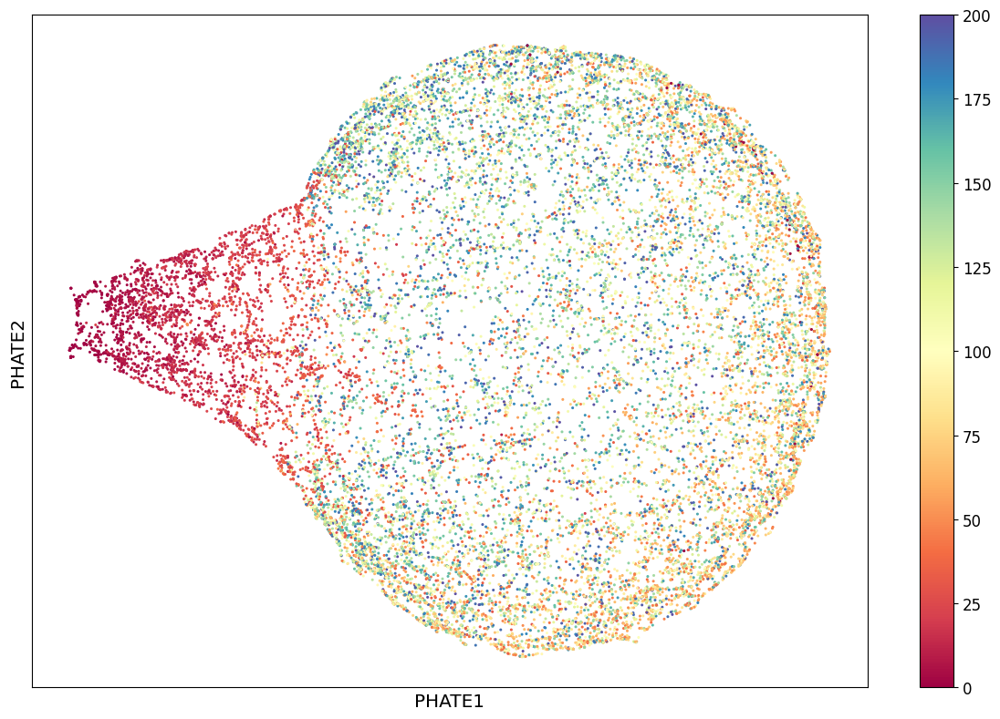

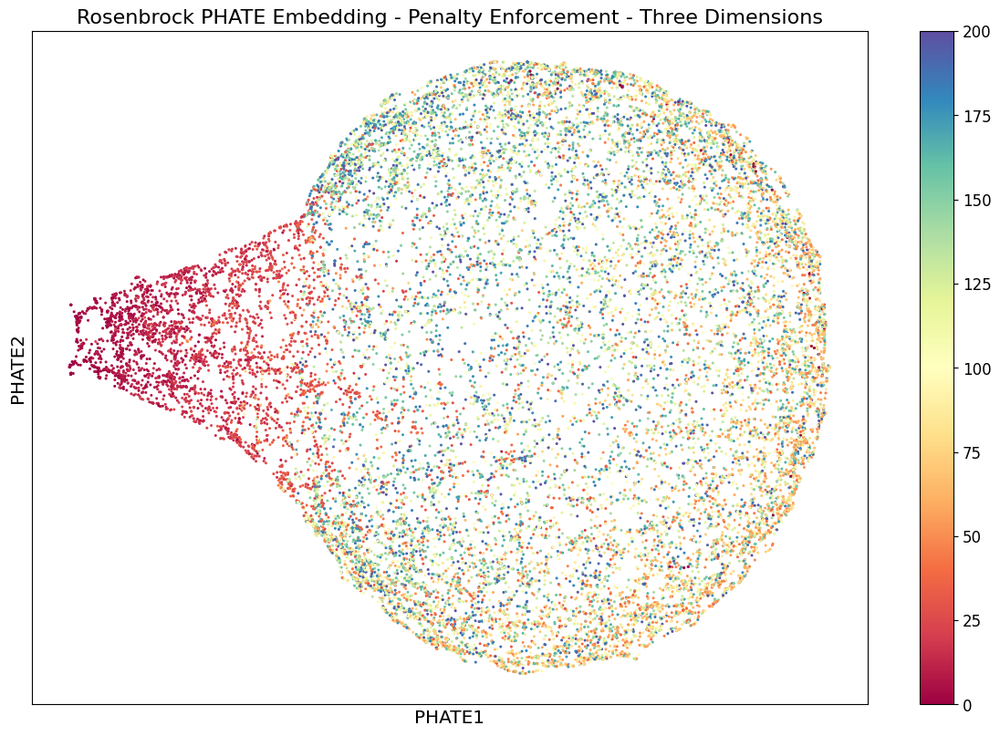

In [4]:
objectives = ['ackley', 'rastrigin', 'griewank', 'rosenbrock']
enforcers = ['Parametric', 'Resample', 'Penalty']
combos = list(itertools.product(objectives, enforcers))

for (objective, enforcer) in combos:
    # Load the data
    file_loc = f'data/3d_constrained_{objective}_{enforcer}.npy'

    # Apply phate
    Y_phate, time = apply_phate(file_loc)

    # Plot the PHATE embedding
    title = f"{objective.capitalize()} PHATE Embedding - {enforcer} Enforcement - Three Dimensions"
    prefix = f"plots/3d_constrained_{objective}_{enforcer}"
    plot_phate(Y_phate, time, title, prefix)

### 10kD